# Imports

In [212]:
### BASIC LIBRARIES
# from datetime import datetime
# !pip install numpy
import numpy as np
# !pip install pandas
import pandas as pd

### VISUALIZATION
# !pip install matplotlib
import matplotlib.pyplot as plt
# !pip install seaborn
# import seaborn as sns
# !pip install plotly
# import plotly.express as px
# !pip install squarify
# import squarify
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10
# !pip install nbformat>=4.2.0

### SKLEARN
# !pip install scikit-learn
# from sklearn.preprocessing import StandardScaler
# from sklearn.impute import KNNImputer
# from sklearn.model_selection import train_test_split
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score

### WARNINGS
import warnings
warnings.filterwarnings('ignore')

### FUNCTIONS
from utils1 import *

### AUTORELOAD
%load_ext autoreload
%autoreload 2


# Set the path to the data files
# path = "C:\\Users\\ritaf\\Documentos\\Estudos\\NovaIMS\\Mestrado_GIBI\\DM_I\\DM_Project\\"


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [213]:
data = pd.read_excel('Data\project_data.xlsx')

In [214]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123683 entries, 0 to 123682
Data columns (total 31 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   ID_Client               123354 non-null  object 
 1   Frequency_items         123683 non-null  int64  
 2   Potencial_Score         123683 non-null  float64
 3   ZIP_Code                123089 non-null  object 
 4   Longevity_months        123683 non-null  int64  
 5   Latitude                123683 non-null  float64
 6   Longitude               123683 non-null  float64
 7   Credit_factor           123683 non-null  float64
 8   Relevance_criteria      123683 non-null  object 
 9   Store_state             123683 non-null  object 
 10  Recency_in_weeks        123683 non-null  int64  
 11  Returns                 123683 non-null  int64  
 12  ID_Store_last           123683 non-null  int64  
 13  Gender                  42566 non-null   object 
 14  Flaged              

In [215]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Frequency_items,123683.0,38.261224,13.594001,1.0,29.000000,37.00000,47.000000,131.000000
Potencial_Score,123683.0,30.392316,99.673585,-1.0,0.800000,24.05884,39.701604,11481.040829
Longevity_months,123683.0,13.665354,9.881178,-12.0,6.000000,13.00000,21.000000,45.000000
Latitude,123683.0,25.249363,29.997630,-5.0,-0.166667,1.00000,60.126211,72.170287
Longitude,123683.0,6.158188,7.697199,-5.0,-0.166667,1.00000,13.971501,30.973885
Credit_factor,123683.0,0.899913,0.799920,0.0,0.700000,0.70000,1.000000,28.400000
Recency_in_weeks,123683.0,11.244706,3.799946,-4.0,9.000000,11.00000,14.000000,18.000000
Returns,123683.0,4.310972,27.629597,-87.0,0.000000,0.00000,0.000000,591.000000
ID_Store_last,123683.0,1.000000,0.000000,1.0,1.000000,1.00000,1.000000,1.000000
Flaged,123683.0,0.010373,0.101639,0.0,0.000000,0.00000,0.000000,2.000000


# Data Transformations

| Column | NaN | Ws/Unkwn | Outliers | Negs | Ambiguous | Dups | Wrong Type | Notes |
| --- | --- | --- | --- | --- | --- | --- | --- | --- |
| ID_Client | x | x |  |  |  | x |  |  |
| Frequency_items |  |  |  |  |  |  |  |  |
| Potencial_Score |  |  | x | x |  |  |  | Round |
| ZIP_Code | x | x |  |  |  |  | x | Obj -> int |
| Longevity_months |  |  |  | x |  |  |  | Calculated 31/12/2023 |
| Latitude & Longitude |  |  |  |  |  |  |  | Block in Africa |
| Credit_factor |  |  | x |  |  |  |  | Different interpretation |
| Relevance_criteria |  | x |  |  |  |  |  | Might convert to boolean |
| Recency_in_weeks |  |  |  | x |  |  |  | Calculated 31/12/2023 |
| Returns |  |  | x | x | |  |  |  |
| Gender | x |  |  |  | x |  |  | Drop -> too many outliers |
| Flaged |  |  |  |  | x |  | x | Is a bool but has 2s |
| Promotional_percentage |  |  | x | x |  |  |  |  |
| Education | x | x |  |  | x |  |  | Drop -> too many outliers |
| Beer |  |  | x |  |  |  |  |  |
| Bottled_Water |  |  | x |  |  |  |  |  |
| Dairy |  |  | x |  |  |  | x | Obj -> int |
| Fresh_Foods |  |  | x | x |  |  |  |  |
| Frozen_Foods | x |  | x | x |  |  |  |  |
| Fruit_Beverages |  |  | x | x |  |  |  |  |
| Pastry |  |  | x |  |  |  |  |  |
| Sodas |  |  | x | x |  |  |  |  |
| Toiletries |  |  | x | x |  |  |  |  |
| Veggies |  |  | x | x |  |  |  |  |
| Wines |  |  | x | x |  |  |  |  |
| ID_Store_last |  |  |  |  |  |  |  | Constant |
| Checked_ok |  |  |  |  |  |  |  | Constant |
| Store_state |  |  |  |  |  |  |  | Constant |

In [216]:
# Drop constant columns
data.drop(columns=['ID_Store_last', 'Checked_ok', 'Store_state'], inplace=True)

# Setting up missing values as NaN
data['ID_Client'].replace(' ', np.nan, inplace=True)

# Round Potencial_Score to 2 decimal places (OPTIONAL)
data['Potencial_Score'] = data['Potencial_Score'].round(2)

# Setting up missing values as NaN and correct data types
data['ZIP_Code'].replace('  ', np.nan, inplace=True) # 1% of NaN
data['ZIP_Code'] = data['ZIP_Code'].astype(float)

# Setting up missing values as NaN and encode the values
data['Relevance_criteria'].replace('Unknown', np.nan, inplace=True) # 1,7% of NaN
data['Relevance_criteria'] = data['Relevance_criteria'].replace({'Priority': 1, 'Caution': 0})

# Correcting values and setting up missing values as NaN
data['Gender'].replace({'Female': 'female', '    ': np.nan, 'm': np.nan, 'mm': np.nan, 'j': np.nan}, inplace=True) # 73% of NaN
data['Gender'] = data['Gender'].replace({'male': 1, 'female': 0})

# Correcting values - VAI SER PRECISO CORRIGIR DATATYPES DEPOIS DE IMPUTAR (FICOU FLOAT POR CAUSSA DE NAN)
data['Flaged'].replace(2, np.nan, inplace=True) # ~0% of NaN

# Correcting values and setting up missing values as NaN
data['Education'].replace({'High School ': 'High School', ' ': np.nan, 'Bachelor Degree': 'BSc Degree'}, inplace=True) # 42% of NaN -> possivel imputar com NumID!
data['Education'] = data['Education'].replace({'High School': 1, 'Degree': 2, 'BSc Degree': 3, 'MSc Degree': 4})

# Convert Dairy to the appropriate data type
dairy_values = data['Dairy'].str.split(',', expand=True)
dairy_values[1] = dairy_values[1].astype(float)
if (dairy_values[1] != 0).any():
    data['Dairy'] = data['Dairy'].str.replace(',', '.').astype(float)
else:
    data['Dairy'] = data['Dairy'].str.replace(',000', '').astype(int)

# Correcting Data Types - VAI SER PRECISO CORRIGIR DATATYPES DEPOIS DE IMPUTAR (FICOU FLOAT POR CAUSSA DE NAN)
# if ((data['Frozen_Foods'].dropna() % 1 == 0).all()):
#     data['Frozen_Foods'] = data['Frozen_Foods'].fillna(1000).astype(int)
#     data['Frozen_Foods'] = data['Frozen_Foods'].replace(1000, np.nan) # 0,5% of NaN

# Correcting Data Types
if ((data['Toiletries'].dropna() % 1 == 0).all()):
    data['Toiletries'] = data['Toiletries'].fillna(1000).astype(int)
    data['Toiletries'] = data['Toiletries'].replace(1000, np.nan) # no missing values


# Graphs

### Ranges

In [217]:
numeric_columns = ['Frequency_items', 'Potencial_Score', 'Longevity_months', 'Credit_factor', 'Recency_in_weeks', 'Returns',
       'Promotional_percentage', 'Beer', 'Bottled_Water', 'Bread', 'Meat', 'Dairy', 'Fresh_Foods', 'Frozen_Foods', 'Fruit_Beverages', 'Pastry',
       'Sodas', 'Toiletries', 'Veggies', 'Wines']
categorical_columns = ['ZIP_Code', 'Relevance_criteria', 'Gender', 'Education', 'Flaged']

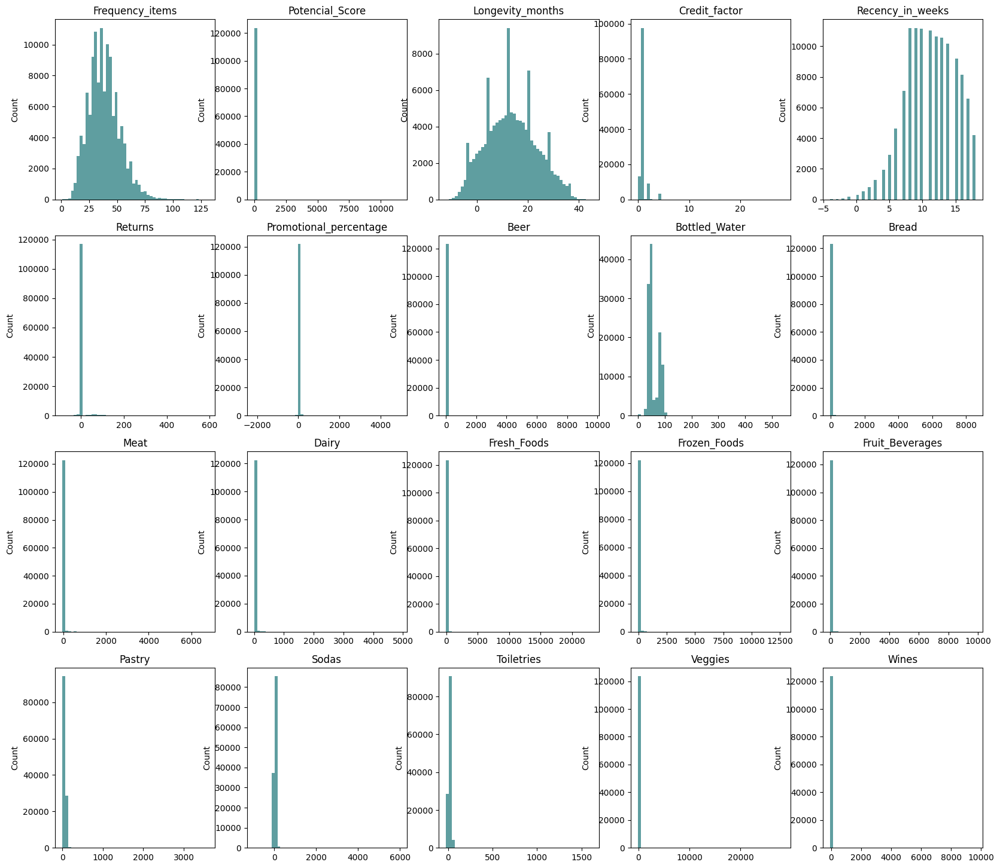

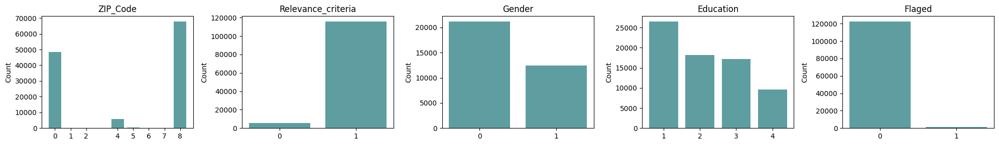

In [218]:
fig_hist, axs_hist = plt.subplots(nrows=4, ncols=5, figsize=(20, 18))
axs_hist = axs_hist.flatten()

fig_bar, axs_bar = plt.subplots(nrows=1, ncols=5, figsize=(20, 3))
axs_bar = axs_bar.flatten()

for i, col in enumerate(numeric_columns):
    plot_histogram(axs_hist[i], data, col, '')
    axs_hist[i].set_title(col)

for i, col in enumerate(categorical_columns):
    plot_bar_chart(axs_bar[i], data, col, '')
    axs_bar[i].set_title(col)

plt.tight_layout()
plt.show()


### Maps

In [219]:
# Sort the DataFrame by the frequency of ZIP_Code
data['ZIP_Code'] = pd.Categorical(data['ZIP_Code'], categories=data['ZIP_Code'].value_counts().index, ordered=True)
data_sorted = data.sort_values('ZIP_Code')

print('Normal Coordinates')
plot_map(data_sorted, 'ZIP_Code', 'ID_Client', 1.2)
print('Inverted Coordinates')
plot_map(data_sorted, 'ZIP_Code', 'ID_Client', 1.6, invert=True)

Normal Coordinates


Inverted Coordinates


# Data Corrections

### Missing Values

Drop columns with high percentages of missing values, irrelevant columns (geographical) and the id

In [220]:
# Drop columns with more than 40% of missing values
data.drop(columns=['Gender', 'Education'], inplace=True)

# Dropping georaphical irrelevant columns
data.drop(columns=['Latitude', 'Longitude', 'ZIP_Code'], inplace=True)

data.drop(columns=['ID_Client'], inplace=True) # Comment to run the ID Section of this Notebook

### Multi-Variable Inconsistencies

Check for inconsistencies in returns

In [221]:
# SET INCONSISTENT VALUES OF RETURNS AS NaN
spent_amounts = ['Beer', 'Bottled_Water', 'Bread', 'Meat', 'Dairy', 'Fresh_Foods', 'Frozen_Foods', 'Fruit_Beverages', 'Pastry', 'Sodas', 'Toiletries', 'Veggies', 'Wines']

# Identify rows where Returns are 0 and there are negative values in any of the spent_amounts_to_check_neg
rows_with_neg_values = data[(data['Returns'] == 0) & (data[spent_amounts] < 0).any(axis=1)]

# Iterate over these rows and update the Returns column and negative values
for index, row in rows_with_neg_values.iterrows():
    data.at[index, 'Returns'] = np.nan

# Check percentage of Returns Missing Values
print(f'Number of inconsistencies: {rows_with_neg_values.shape[0]}')
print(f"Current percentage Returns' null values: {round(data[data['Returns'].isnull()].shape[0] / 123683 * 100, 2)}%")

Number of inconsistencies: 44090
Current percentage Returns' null values: 35.65%


### Negative Values Inconsistencies

Negative Spent Amounts and Promotional Percentage

In [222]:
# Percentage of negative values in each spent amounts column
spent_amounts.append('Promotional_percentage')

# Create a DataFrame to store the results
negative_percentage_df = pd.DataFrame()

# Add the negative percentage data for each dataset
negative_percentage_df['%Neg Values'] = round((((data[spent_amounts] < 0).sum()) / data.shape[0]) * 100, 2)
spent_amounts.remove('Promotional_percentage')

# Transpose the DataFrame for better readability
# negative_percentage_df = negative_percentage_df.T

# Filter out columns with zero percentage
# negative_percentage_df = negative_percentage_df.loc[:, (negative_percentage_df != 0).any(axis=0)] # for transposed DataFrame
negative_percentage_df = negative_percentage_df.loc[(negative_percentage_df != 0).any(axis=1), :]

# Sort values
negative_percentage_df = negative_percentage_df.sort_values(by='%Neg Values', ascending=False)

# Display the DataFrame
negative_percentage_df

,%Neg Values
Wines,13.64
Veggies,12.60
Sodas,11.70
Toiletries,3.85
Promotional_percentage,1.17
Fruit_Beverages,1.04
Fresh_Foods,0.95
Frozen_Foods,0.89
Meat,0.06


In [223]:
# Set negative spent amounts and promotional percentage to 0
data[spent_amounts] = data[spent_amounts].applymap(lambda x: max(x, 0))
data['Promotional_percentage'] = data['Promotional_percentage'].apply(lambda x: max(x, 0))

Negative Returns, Recency & Longevity

In [224]:
# SET NEGATIVE VALUES IN RETURNS, RECENCY AND LONGEVITY AS NaN TO BE IMPUTED LATER
inconsistent_neg_cols = ['Returns', 'Recency_in_weeks', 'Longevity_months']
for col in inconsistent_neg_cols:
    data[col] = data[col].apply(lambda x: np.nan if x < 0 else x)

print(f'Returns missing values: {round(data["Returns"].isna().sum() / 123683 * 100, 2)}%')
print(f'Recency missing values: {round(data["Recency_in_weeks"].isna().sum() / 123683 * 100,2)}%')
print(f'Longevity missing values: {round(data["Longevity_months"].isna().sum() / 123683 * 100,2)}%')

Returns missing values: 37.32%
Recency missing values: 0.2%
Longevity missing values: 7.95%


### Range Inconsistencies

Check percentage of out of range values for Potencial Score, Promotional Percentage and Credit Factor

In [225]:
print(f'# out of bounds Portencial Score: {round(data[data['Potencial_Score'] > 1].shape[0] / 123683 * 100, 2)}%')
print(f'# out of bounds Credit Factor: {round(data[data['Credit_factor'] > 1].shape[0] / 123683 * 100, 2)}%')

# out of bounds Portencial Score: 71.38%
# out of bounds Credit Factor: 10.54%


In [226]:
# Set Credit Factor out of bounds as NaN
data.loc[data['Potencial_Score'] > 1, 'Potencial_Score'] = np.nan
data.loc[data['Credit_factor'] > 1, 'Credit_factor'] = np.nan

### Dropping Columns

Drop columns with elevated number of inconsistent (coverted to missing) values 

In [227]:
# Calculate the threshold for 35% NaNs
threshold = len(data) * 0.35

# Identify columns to drop
columns_to_drop = data.columns[data.isna().sum() > threshold]

# Drop the columns
data.drop(columns=columns_to_drop, inplace=True)

# Print the names of the dropped columns
print("Dropped columns:", columns_to_drop.tolist())

Dropped columns: ['Potencial_Score', 'Returns']


# Graphs after treatment

In [229]:
numeric_columns_after = ['Frequency_items', 'Longevity_months', 'Credit_factor', 'Recency_in_weeks',
       'Promotional_percentage', 'Beer', 'Bottled_Water', 'Bread', 'Meat', 'Dairy', 'Fresh_Foods', 'Frozen_Foods', 'Fruit_Beverages', 'Pastry',
       'Sodas', 'Toiletries', 'Veggies', 'Wines']
categorical_columns_after = ['Relevance_criteria', 'Flaged']

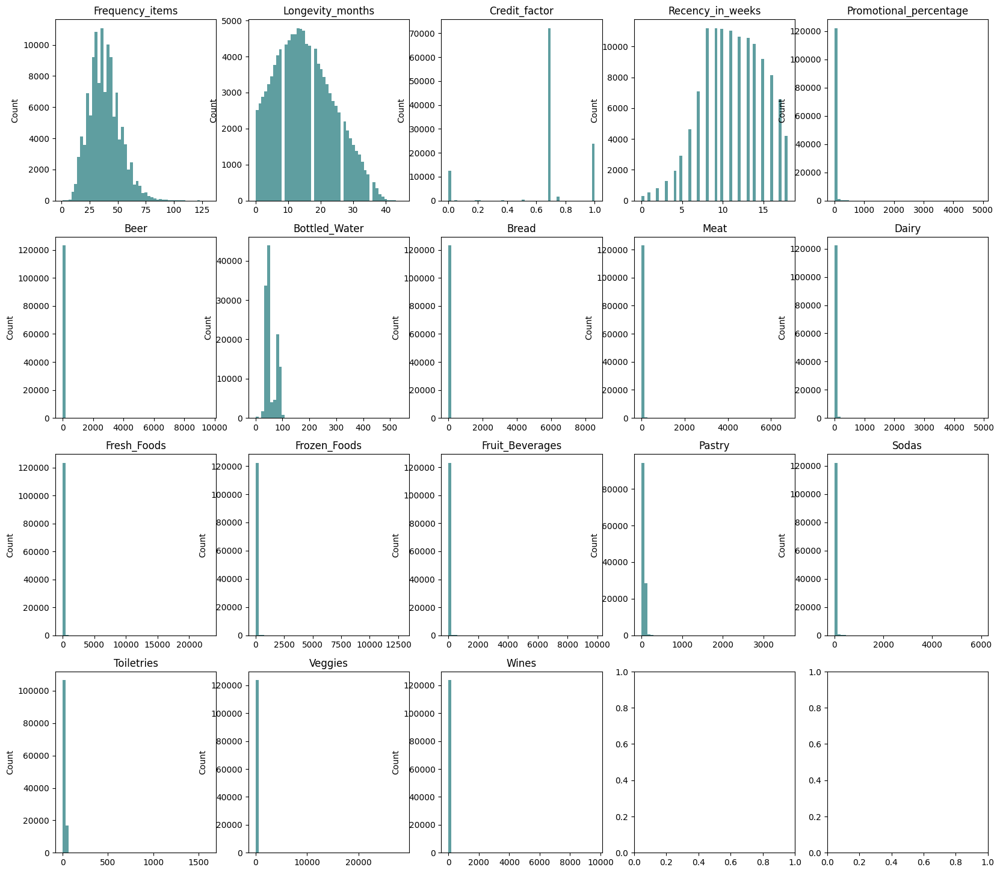

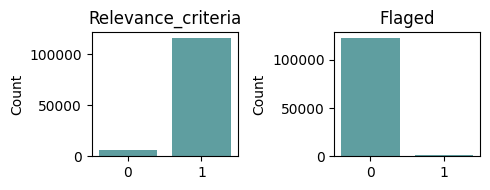

In [233]:
numeric_columns_after = ['Frequency_items', 'Longevity_months', 'Credit_factor', 'Recency_in_weeks',
       'Promotional_percentage', 'Beer', 'Bottled_Water', 'Bread', 'Meat', 'Dairy', 'Fresh_Foods', 'Frozen_Foods', 'Fruit_Beverages', 'Pastry',
       'Sodas', 'Toiletries', 'Veggies', 'Wines']
categorical_columns_after = ['Relevance_criteria', 'Flaged']

fig_hist, axs_hist = plt.subplots(nrows=4, ncols=5, figsize=(20, 18))
axs_hist = axs_hist.flatten()

fig_bar, axs_bar = plt.subplots(nrows=1, ncols=2, figsize=(5, 2))
axs_bar = axs_bar.flatten()

for i, col in enumerate(numeric_columns_after):
    plot_histogram(axs_hist[i], data, col, '')
    axs_hist[i].set_title(col)

for i, col in enumerate(categorical_columns_after):
    plot_bar_chart(axs_bar[i], data, col, '')
    axs_bar[i].set_title(col)

plt.tight_layout()
plt.show()


Ver gráficos sen outliers

# Correlations

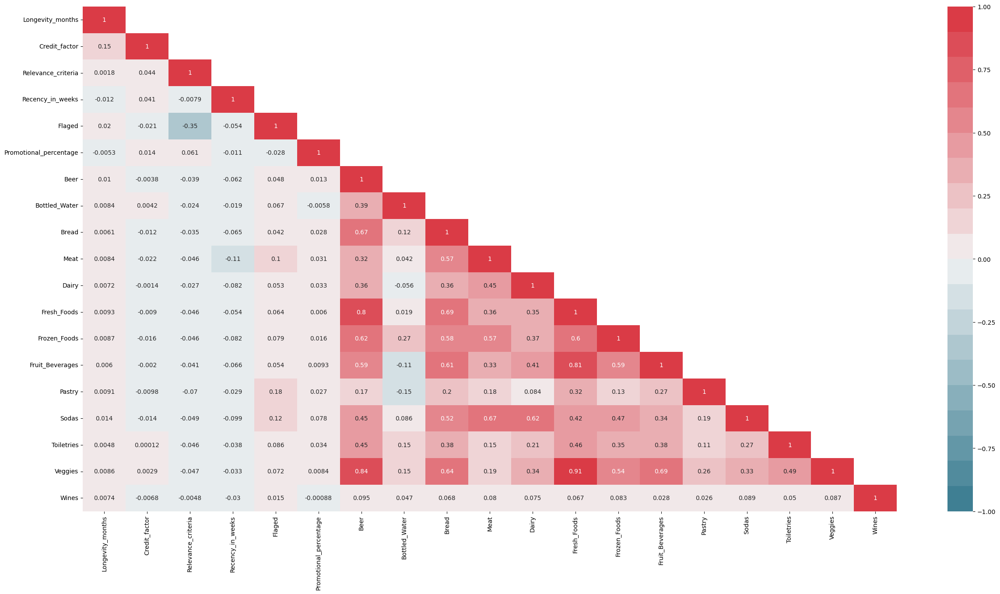

In [108]:
plot_correlation_matrix(data.iloc[:, 1:], 'pearson')

# IDs

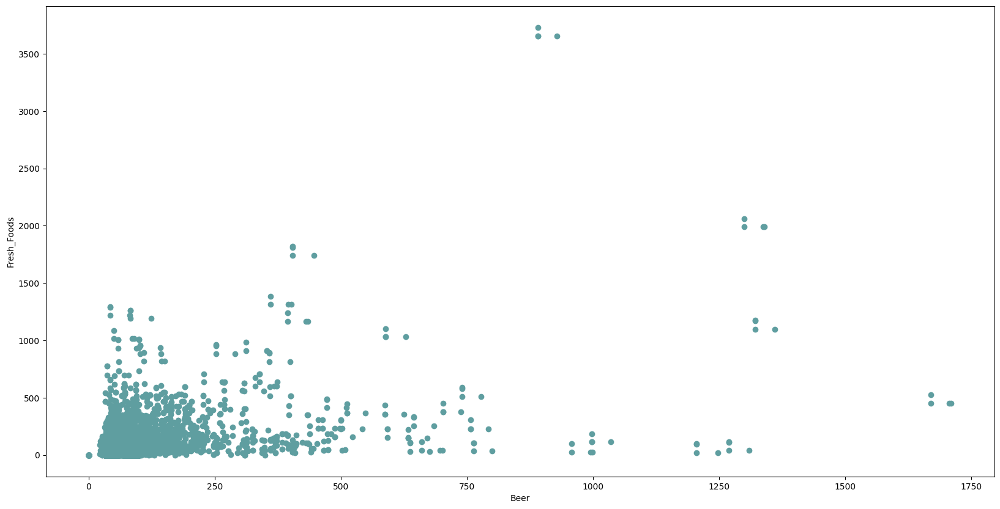

In [53]:
plot_scatter(plt.subplots()[1], data.drop(data[data['Beer'] > 5000].index), 'Beer', 'Fresh_Foods')

In [54]:
pd.set_option('display.max_columns', None)
data[(data['Beer'] > 1500) & (data['Beer'] < 1750)]

,ID_Client,Frequency_items,Potencial_Score,Longevity_months,Credit_factor,Relevance_criteria,Recency_in_weeks,Returns,Flaged,Promotional_percentage,Beer,Bottled_Water,Bread,Meat,Dairy,Fresh_Foods,Frozen_Foods,Fruit_Beverages,Pastry,Sodas,Toiletries,Veggies,Wines
3115,10023562SCO9NKID809,54,78.53,18.0,0.7,1.0,7.0,NaN,0.0,32.0,1670,40,144,57,88,450,44.0,36,110,0,29,30,111
42537,10023562SCO9NKID555,59,78.83,26.0,0.7,1.0,7.0,0.0,0.0,32.0,1710,81,144,57,34,450,119.0,36,30,13,34,26,82
42538,10023562SCO9NKID661,59,80.13,20.0,0.7,1.0,4.0,NaN,0.0,32.0,1706,78,144,57,34,450,125.0,36,30,0,21,22,82
42539,10023562SCO9NKID481,43,79.93,14.0,0.7,1.0,0.0,NaN,0.0,32.0,1670,40,144,57,34,524,44.0,113,30,0,20,22,67


In [55]:
pd.set_option('display.max_columns', None)
data[(data['Fresh_Foods'] > 3000) & (data['Beer'] < 5000)]

,ID_Client,Frequency_items,Potencial_Score,Longevity_months,Credit_factor,Relevance_criteria,Recency_in_weeks,Returns,Flaged,Promotional_percentage,Beer,Bottled_Water,Bread,Meat,Dairy,Fresh_Foods,Frozen_Foods,Fruit_Beverages,Pastry,Sodas,Toiletries,Veggies,Wines
19124,9563830SCA6NKID585,39,77.5,19.0,0.0,0.0,8.0,0.0,1.0,0.0,891,52,1127,6771,82,3654,6988.0,624,1393,4303,95,674,359
89512,9563830SCA6NKID342,32,78.9,20.0,0.0,0.0,5.0,0.0,1.0,0.0,891,52,1138,6771,28,3731,7069.0,704,1393,4303,85,677,360
89513,9563830SCA6NKID633,32,78.6,13.0,0.0,0.0,NaN,0.0,1.0,0.0,928,90,1138,6771,28,3654,7063.0,624,1393,4281,86,677,374
89514,9563830SCA6NKID805,27,78.7,17.0,0.0,0.0,NaN,0.0,1.0,0.0,891,52,1138,6771,28,3654,6988.0,624,1474,4255,2,676,361


In [56]:
data['NumID'] = data['ID_Client'].str.extract(r'^(\d+)')
data['SeqID'] = data['ID_Client'].str.replace(r'^\d+|\d+$', '', regex=True)
data['RepID'] = data['ID_Client'].str.extract(r'(\d+)$')

In [57]:
data['NumID'].value_counts()

NumID
10153360    8
9337686     4
10557943    4
10223386    4
10468039    4
           ..
917998      2
10359812    2
99830       2
9437209     2
9561327     2
Name: count, Length: 31056, dtype: int64

There are groups of 2, 3 and 4 replicas. There is just one case in which, for some reason there are 8 (but it is 2 groups of 4)

### Check if filling missing values with NumID is an option

In [12]:
# Group by NumID and check unique values of Education
educ_check = data.groupby('NumID')['Education'].apply(lambda x: x.dropna().unique())

# Filter groups with more than one unique value
ambiguous_educ = educ_check[educ_check.apply(lambda x: len(x) > 1)]

# Display the ambiguous groups
print("Groups with ambiguous Education values:")
ambiguous_educ

Groups with ambiguous Education values:


NumID
10153360    [1.0, 4.0]
Name: Education, dtype: object

There is just one value in which there is more than one value of education inside a group of datapoints with the same NumID (it is the one that has 8 datapoints)

In [14]:
# Group by NumID and check unique values of Gender
gender_check = data.groupby('NumID')['Gender'].apply(lambda x: x.dropna().unique())

# Filter groups with more than one unique value
ambiguous_gender = gender_check[gender_check.apply(lambda x: len(x) > 1)]

# Display the ambiguous groups
print("Groups with ambiguous Gender values:")
ambiguous_gender

Groups with ambiguous Gender values:


NumID
100036      [1.0, 0.0]
100093      [1.0, 0.0]
10011423    [0.0, 1.0]
10011756    [0.0, 1.0]
10012552    [0.0, 1.0]
               ...    
9974040     [0.0, 1.0]
99772       [1.0, 0.0]
998622      [1.0, 0.0]
998865      [1.0, 0.0]
999721      [0.0, 1.0]
Name: Gender, Length: 4744, dtype: object

There are many values with ambiguity. We can not derive anything for certain based on NumID.

# TENTATIVAS DE COISAS DESCARTADAS

In [ ]:
# SOMAR OS VALORES NEGATIVOS DOS SPENT AMOUNTS E COLOCAR EM MODULO NA COLUNA RETURNS
# Identify rows where Returns are 0 and there are negative values in any of the columns_to_check_neg
rows_with_neg_values = data[(data['Returns'] == 0) & (data[columns_to_check_neg] < 0).any(axis=1)]

# Iterate over these rows and update the Returns column
for index, row in rows_with_neg_values.iterrows():
    # Sum the negative values, turn it into a positive value
    negative_sum = row[columns_to_check_neg][row[columns_to_check_neg] < 0].sum() * -1
    # Update the Returns column
    data.at[index, 'Returns'] = negative_sum

# Display the updated rows to verify
data.loc[rows_with_neg_values.index, ['Returns'] + columns_to_check_neg]

,Returns,Beer,Bottled_Water,Bread,Meat,Dairy,Fresh_Foods,Frozen_Foods,Fruit_Beverages,Pastry,Sodas,Toiletries,Veggies,Wines
1,12,46,58,14,7,90,134,26.0,20,31,-12,2,18,2
2,19,39,57,17,0,89,39,-6.0,25,32,17,33,26,-13
3,2,50,41,17,0,89,26,66.0,16,29,31,28,-2,8
4,2,43,46,13,0,90,-2,57.0,27,45,46,19,23,9
12,7,51,49,25,0,89,11,38.0,22,33,-7,20,105,68
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
123370,7,51,48,29,1,100,88,151.0,117,109,124,7,-7,11
123373,6,51,48,29,1,100,88,234.0,109,26,94,20,-6,6
123379,2,39,37,12,6,100,42,50.0,33,25,70,22,-2,31
123383,11,61,48,13,9,100,61,41.0,26,25,27,23,11,-11
